## 十分钟速通RAGFlow
RAGFlow是一款基于深度文档理解构建的开源 RAG（Retrieval-Augmented Generation）引擎。RAGFlow 可以为各种规模的企业及提供一套专业的 RAG 工作流程，结合大语言模型（LLM）针对用户群体不同的复杂格式数据提供可靠的问答以及有理有据的引用

从具体功能上来讲，RAGFlow提供了以下几点能力：

### 一，"Quality in,Quality Out"
    1、基于深度文档理解，能够从各类复杂格式的非结构化数据中提取真知灼见。
    2、真正在无限上下文（token）的场景下快速完成大海捞针测试。
### 二，基于模版的文本切片
    1、不仅仅是智能，更重要的是可控可解释。
    2、多种文本模版可供选择。
### 三，有理有据，最大程度降低幻觉（hallucination）
    1、文本切片过程可视化，支持手动调整。
    2、有理有据：答案提供关键引用的快照并支持追根溯源。
### 四，兼容各类异构数据源
    支持丰富的文件类型，包括Word文档、PPT、excel表格、txt文件、图片、PDF、影印件、复印件、结构化数据、网页等。
### 五，全程无忧、自动化的RAG工作流
    1、全面优化的 RAG 工作流可以支持从个人应用乃至超大型企业的各类生态系统。
    2、大语言模型 LLM 以及向量模型均支持配置。
    3、基于多路召回、融合重排序。
    4、提供易用的 API，可以轻松集成到各类企业系统。
RAGFlow框架是需要进行部署的，但是也提供了一个线上简单demo以供试用：https://demo.ragflow.io RAGFlow截至目前已经达到了4w+ star。在这个ipynb中，我们会尝试本地搭建RAGFlow环境，并配置一个简单的RAGFlow聊天助手，以展示RAGFlow的简单易用性。

# 方式1、使用docker方式启动RAGFlow服务

### 📝 前提条件

- CPU >= 4 核
- RAM >= 16 GB
- Disk >= 50 GB
- Docker >= 24.0.0 & Docker Compose >= v2.26.1
  > 如果你并没有在本机安装 Docker（Windows、Mac，或者 Linux）, 可以参考文档 [Install Docker Engine](https://docs.docker.com/engine/install/) 自行安装。

### 🚀 启动服务器

1. 确保 `vm.max_map_count` 不小于 262144：

   > 如需确认 `vm.max_map_count` 的大小：
   >
   > ```bash
   > $ sysctl vm.max_map_count
   > ```
   >
   > 如果 `vm.max_map_count` 的值小于 262144，可以进行重置：
   >
   > ```bash
   > # 这里我们设为 262144:
   > $ sudo sysctl -w vm.max_map_count=262144
   > ```
   >
   > 你的改动会在下次系统重启时被重置。如果希望做永久改动，还需要在 **/etc/sysctl.conf** 文件里把 `vm.max_map_count` 的值再相应更新一遍：
   >
   > ```bash
   > vm.max_map_count=262144
   > ```

In [ ]:
# 首先我们需要Clone RAGFlow的代码,Clone只需要运行一次即可
!git clone https://github.com/infiniflow/ragflow.git

In [ ]:
# 进入 docker 文件夹，利用提前编译好的 Docker 镜像启动服务器：
%cd ragflow/docker
!docker compose -f docker-compose.yml up -d

# 如果你遇到 Docker 镜像拉不下来的问题，可以在 docker/.env 文件内根据变量 RAGFLOW_IMAGE 的注释提示选择华为云或者阿里云的相应镜像。

# 华为云镜像名：swr.cn-north-4.myhuaweicloud.com/infiniflow/ragflow
# 阿里云镜像名：registry.cn-hangzhou.aliyuncs.com/infiniflow/ragflow

In [ ]:
# 服务器启动成功后再次确认服务器状态：
!docker logs -f ragflow-server

   _出现以下界面提示说明服务器启动成功：_

   ```bash
        ____   ___    ______ ______ __
       / __ \ /   |  / ____// ____// /____  _      __
      / /_/ // /| | / / __ / /_   / // __ \| | /| / /
     / _, _// ___ |/ /_/ // __/  / // /_/ /| |/ |/ /
    /_/ |_|/_/  |_|\____//_/    /_/ \____/ |__/|__/

    * Running on all addresses (0.0.0.0)
    * Running on http://127.0.0.1:9380
    * Running on http://x.x.x.x:9380
    INFO:werkzeug:Press CTRL+C to quit
   ```

   > 如果您跳过这一步系统确认步骤就登录 RAGFlow，你的浏览器有可能会提示 `network anormal` 或 `网络异常`，因为 RAGFlow 可能并未完全启动成功。

5. 在你的浏览器中输入你的服务器对应的 IP 地址并登录 RAGFlow。
   > 上面这个例子中，您只需输入 http://IP_OF_YOUR_MACHINE 即可：未改动过配置则无需输入端口（默认的 HTTP 服务端口 80）。
6. 在 [service_conf.yaml.template](./docker/service_conf.yaml.template) 文件的 `user_default_llm` 栏配置 LLM factory，并在 `API_KEY` 栏填写和你选择的大模型相对应的 API key。

   > 详见 [llm_api_key_setup](https://ragflow.io/docs/dev/llm_api_key_setup)。

   _好戏开始，接着奏乐接着舞！_


## 方式二 以源代码方式启动RAFGFlow服务
这种方式比较复杂，对RAGFlow有开发需求的可以选择这一种

In [4]:
# 安装 uv。如已经安装，可跳过本步骤：
!pipx install uv
!export UV_INDEX=https://pypi.tuna.tsinghua.edu.cn/simple

'uv' already seems to be installed. Not modifying existing installation in
'/Users/yrk/.local/pipx/venvs/uv'. Pass '--force' to force installation.


In [ ]:
# 下载源代码并安装 Python 依赖：
!git clone https://github.com/infiniflow/ragflow.git
%cd ragflow/
!uv sync --python 3.10 --all-extras # install RAGFlow dependent python modules

In [ ]:
# 通过 Docker Compose 启动依赖的服务（MinIO, Elasticsearch, Redis, and MySQL）：
!docker compose -f docker/docker-compose-base.yml up -d

# 在 `/etc/hosts` 中添加以下代码，将 **conf/service_conf.yaml** 文件中的所有 host 地址都解析为 `127.0.0.1`：
# 127.0.0.1       es01 infinity mysql minio redis


In [ ]:
# 如果无法访问 HuggingFace，可以把环境变量 `HF_ENDPOINT` 设成相应的镜像站点：
!export HF_ENDPOINT=https://hf-mirror.com


In [ ]:
# 启动后端服务：
!source .venv/bin/activate
!export PYTHONPATH=$(pwd)
!bash docker/launch_backend_service.sh

In [ ]:
# 安装前端依赖：
%cd web
!npm install

In [ ]:
# 启动前端服务：
!npm run dev

出现以下界面说明系统已经成功启动
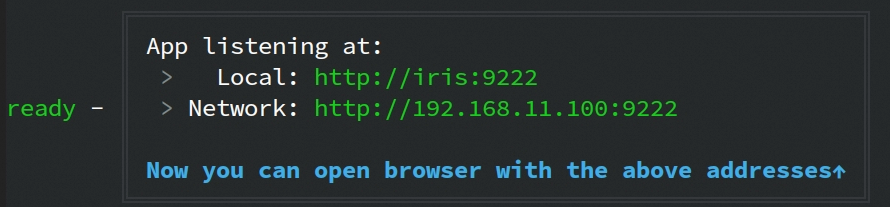

使用RAGFlow是非常直观简单的。首先你需要根据现有的模型供应商选择一个模型。我们以魔搭社区ModelScope为例来介绍如何下载需要的模型，其他的模型供应商做法类似。
ModelScope魔搭社区在RAGFlow的Repo中主要提供了下载chat模型的功能。
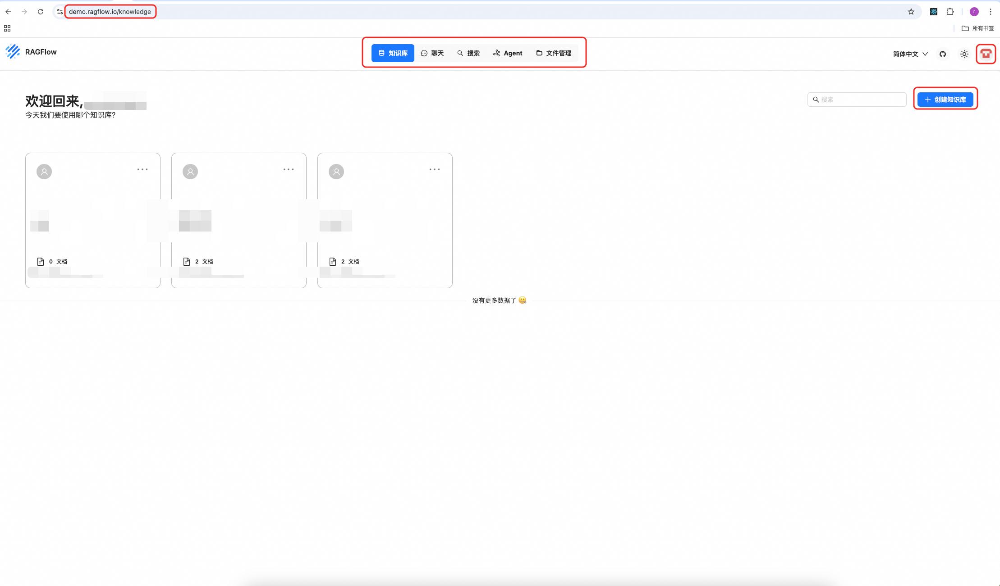
这里以RAGFlow的demo试用界面为例，可以看到首页上有几个功能模块，点击在最右上角的头像图标，可以进入设置界面。
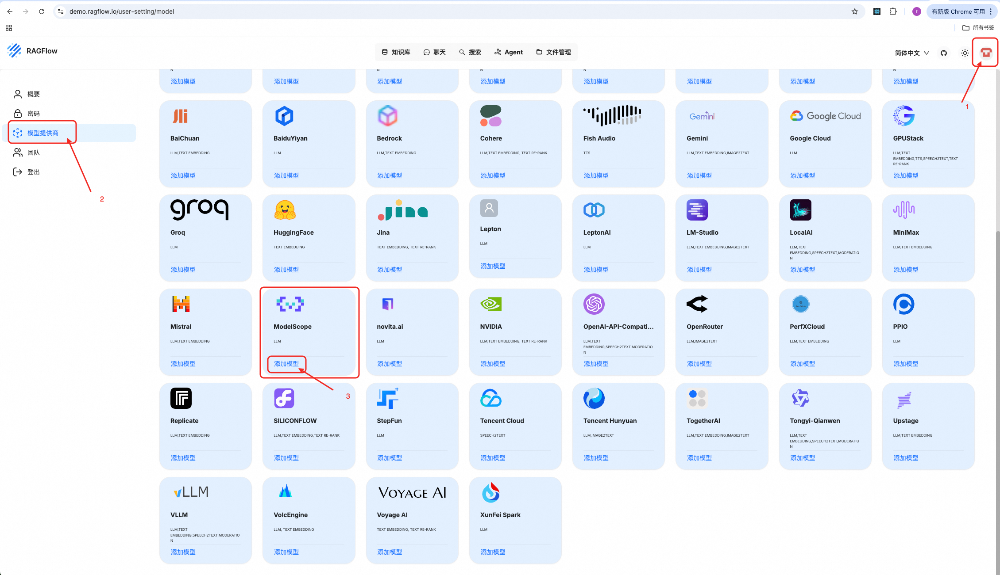
在设置界面的侧边栏，点击模型提供商，可以看到RAGFlow支持的模型厂商，这里以modelscope为例。
找到modelscope的模型卡片，点击添加模型。会出现模型添加的选择框。
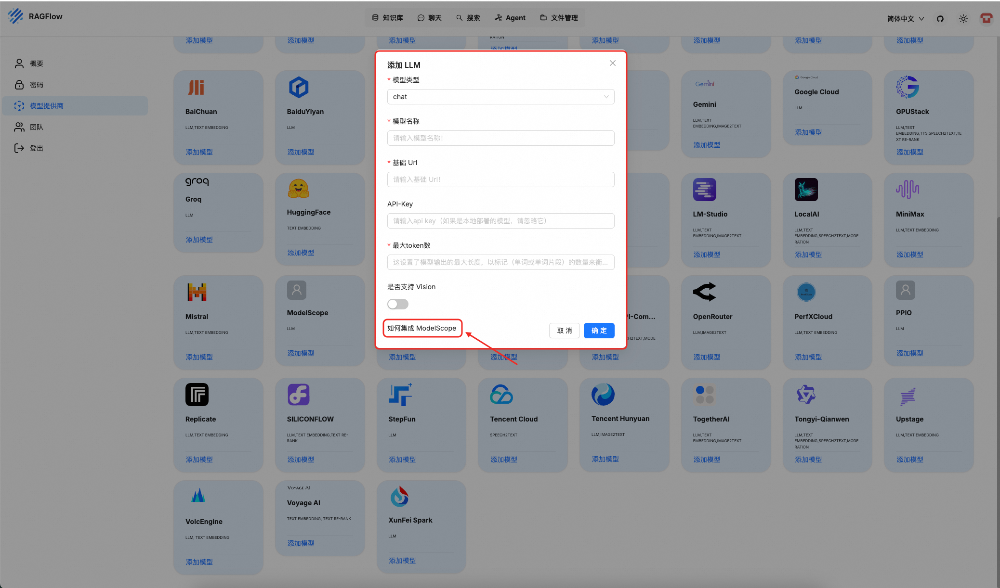
值得注意的是，这里需要的参数可以在下面的如何集成ModelScope链接中找到，像是基础Url，以及ModelScope的免费API-key如何获取等等。
关于魔搭支持的模型，可以在魔搭社区的模型库中筛选得到。如下图：
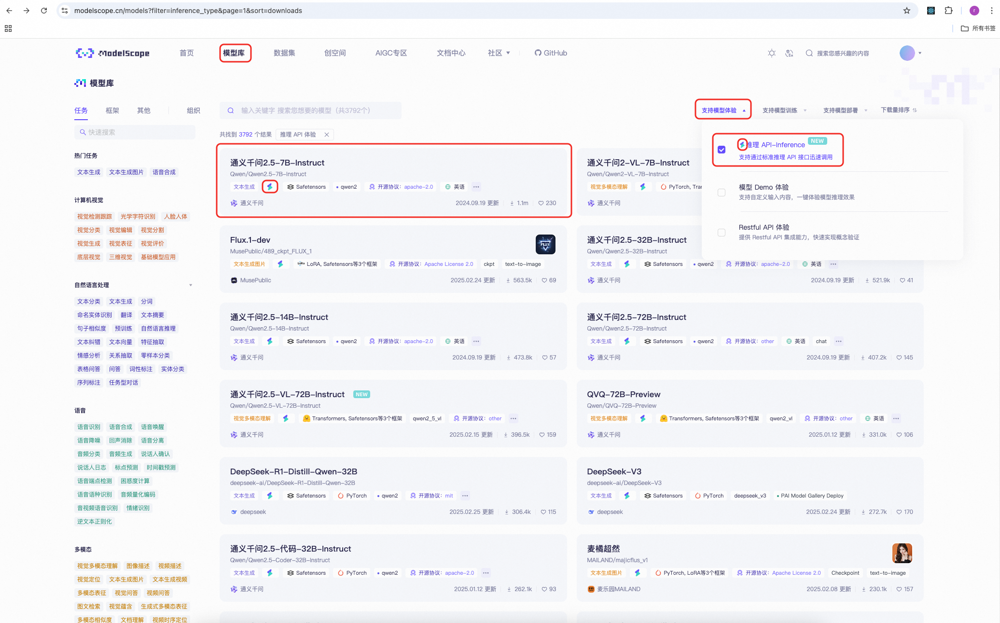
选择需要的模型，点击模型卡片进入详情页，复制模型ID，返回RAGFlow的界面进行填写。
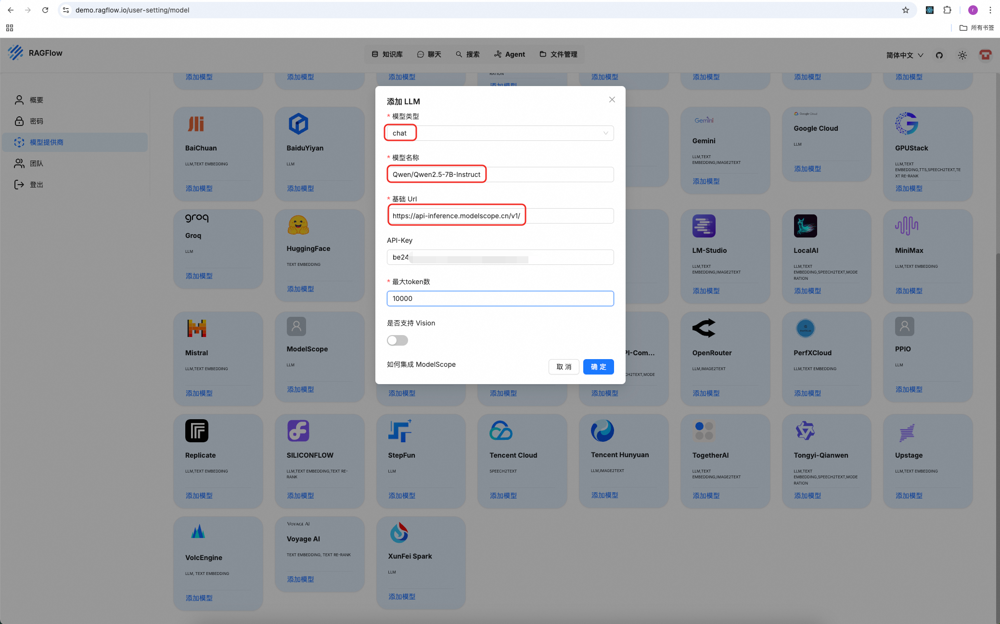
点击确定即可添加模型。添加模型完成之后，会在上面的已添加的模型中看到从魔搭添加的模型列表。
回到RAGFlow的首页，点击新建知识库进行文档的上传，输入知识库名称之后来到详情页
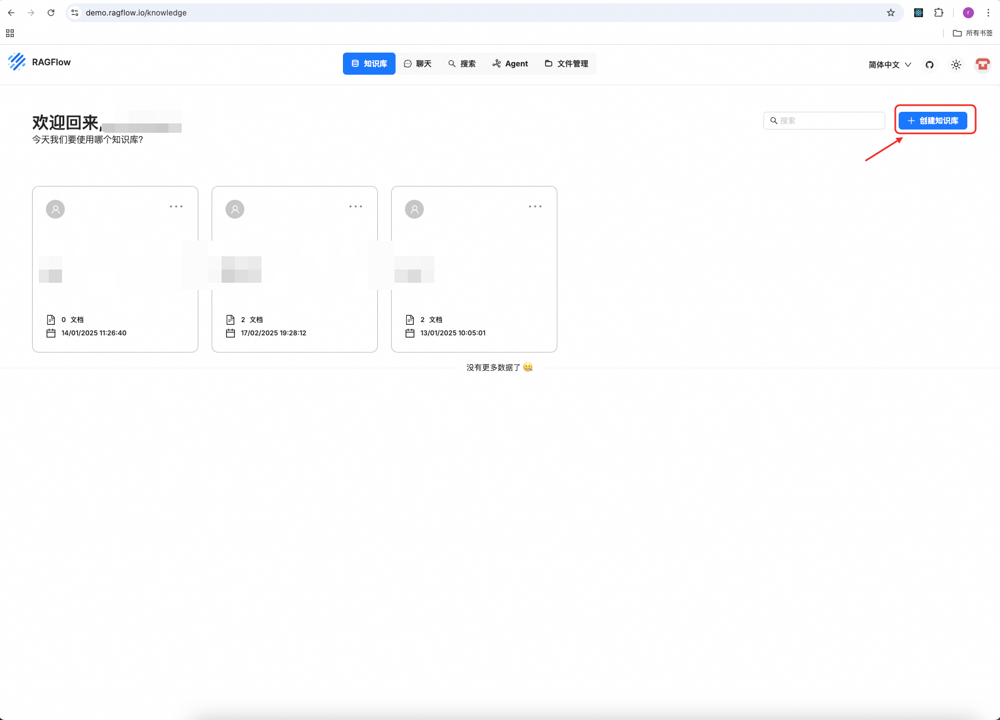
可以根据需要上传本地文档，或者新建空文档。
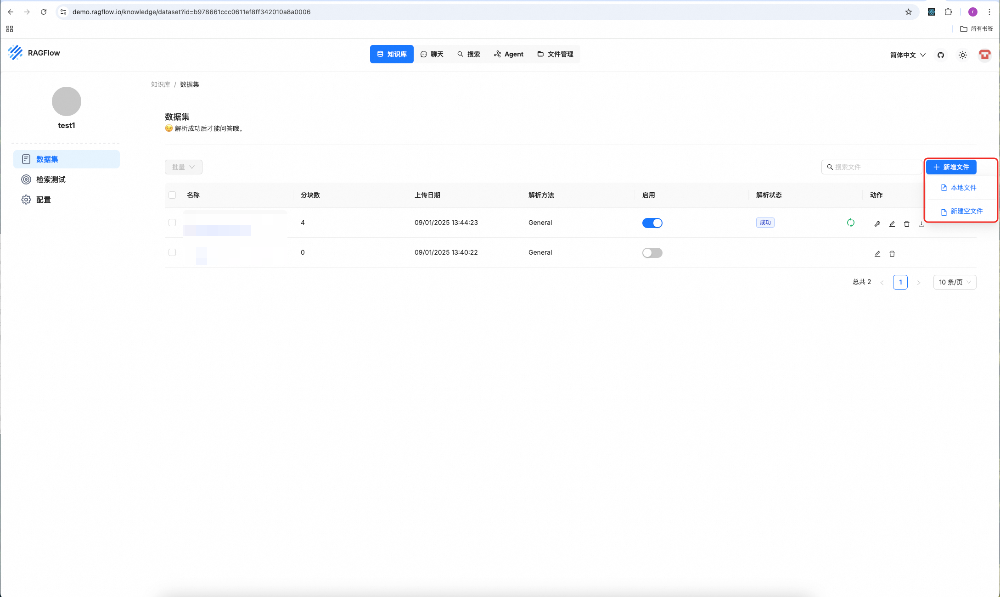
上传成功之后点击解析按钮，文档解析成功之后就可以进行知识库的使用了！
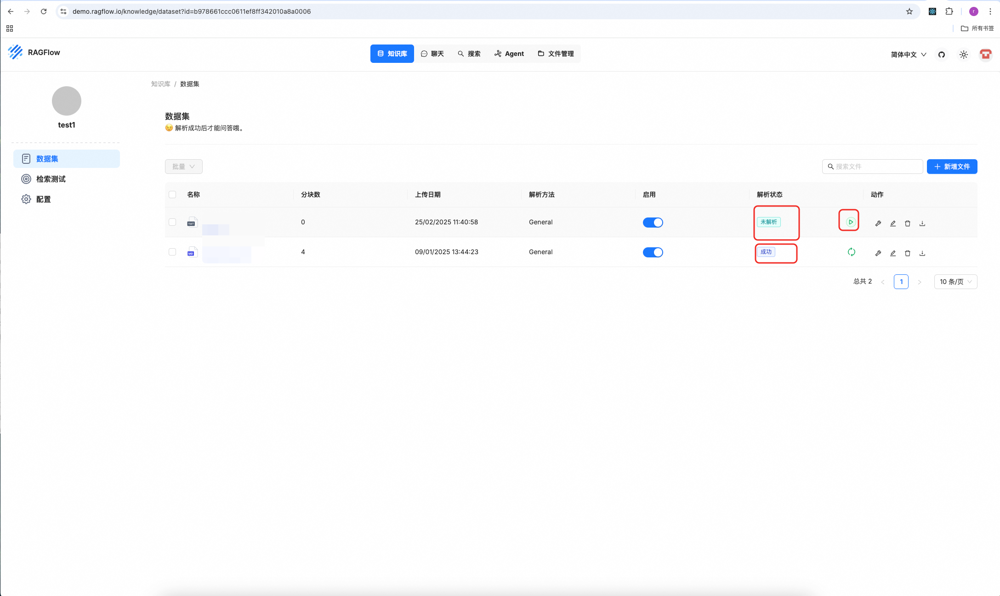
点击聊天模块，新建助理，来到助理设置界面，可以对助理的信息进行设置，比如名字、开场白、头像、提示引擎、以及聊天模型的选择等等。配置完成之后就可以开始使用从魔搭社区下载好的模型了。
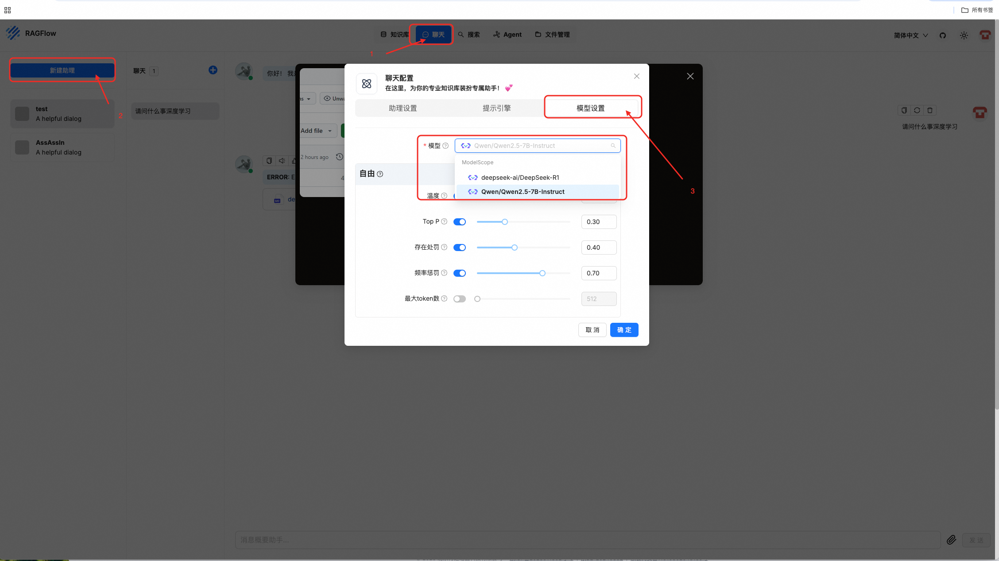
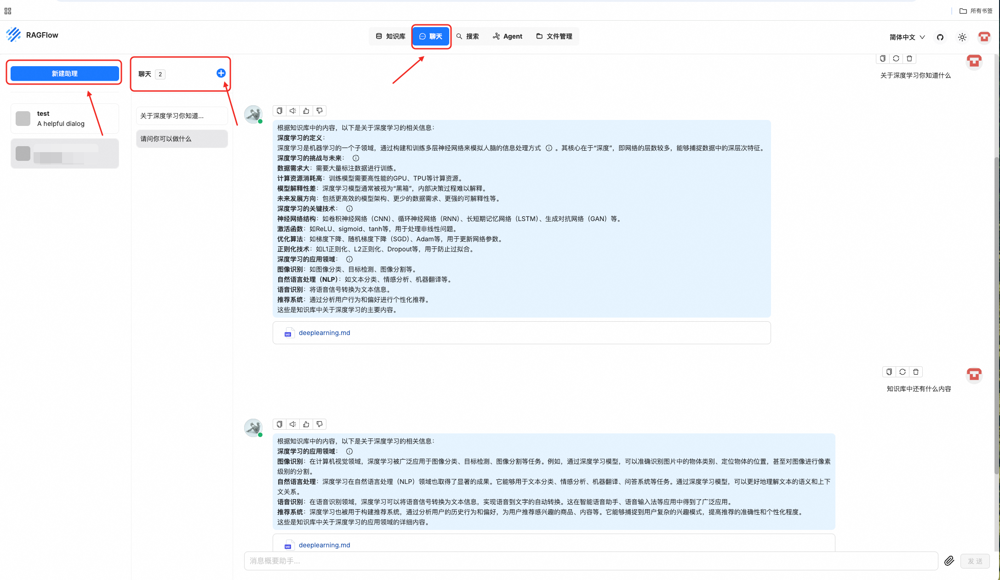